<a href="https://colab.research.google.com/github/DeviAkshaya/AICTE-internship/blob/main/week1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import  accuracy_score,classification_report,ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

loading data

In [2]:
df1=pd.read_csv('modis2021.csv')
df2=pd.read_csv('modis2022.csv')
df3=pd.read_csv('modis2023.csv')

In [ ]:
df1.head()


,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,01-01-2021,409,Terra,MODIS,44,6.03,292.6,8.6,D,0
1,30.0420,79.6492,301.8,1.4,1.2,01-01-2021,547,Terra,MODIS,37,6.03,287.4,9.0,D,0
2,30.0879,78.8579,300.2,1.3,1.1,01-01-2021,547,Terra,MODIS,8,6.03,286.5,5.4,D,0
3,30.0408,80.0501,302.0,1.5,1.2,01-01-2021,547,Terra,MODIS,46,6.03,287.7,10.7,D,0
4,30.6565,78.9668,300.9,1.3,1.1,01-01-2021,547,Terra,MODIS,43,6.03,287.6,9.0,D,0


In [ ]:
df2.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,30.1138,80.0756,300.0,1.2,1.1,01-01-2022,511,Terra,MODIS,7,6.03,288.4,7.1,D,0
1,23.7726,86.2078,306.1,1.6,1.2,01-01-2022,512,Terra,MODIS,62,6.03,293.5,10.4,D,2
2,22.2080,84.8627,304.8,1.4,1.2,01-01-2022,512,Terra,MODIS,42,6.03,293.3,5.8,D,2
3,23.7621,86.3946,306.9,1.6,1.2,01-01-2022,512,Terra,MODIS,38,6.03,295.2,9.3,D,2
4,23.6787,86.0891,303.6,1.5,1.2,01-01-2022,512,Terra,MODIS,52,6.03,293.1,7.2,D,2


In [ ]:
df3.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,9.3280,77.6247,318.0,1.1,1.0,01-01-2023,821,Aqua,MODIS,62,61.03,305.0,7.6,D,0
1,10.4797,77.9378,313.8,1.0,1.0,01-01-2023,822,Aqua,MODIS,58,61.03,299.4,4.3,D,0
2,13.2478,77.2639,314.7,1.0,1.0,01-01-2023,822,Aqua,MODIS,55,61.03,302.4,4.9,D,0
3,12.2994,78.4085,314.3,1.0,1.0,01-01-2023,822,Aqua,MODIS,58,61.03,301.9,4.8,D,0
4,14.1723,75.5024,338.4,1.2,1.1,01-01-2023,823,Aqua,MODIS,88,61.03,305.3,41.5,D,0


In [4]:
df = pd.concat([df1, df2, df3], ignore_index=True)
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,01-01-2021,409.0,Terra,MODIS,44.0,6.03,292.6,8.6,D,0.0
1,30.0420,79.6492,301.8,1.4,1.2,01-01-2021,547.0,Terra,MODIS,37.0,6.03,287.4,9.0,D,0.0
2,30.0879,78.8579,300.2,1.3,1.1,01-01-2021,547.0,Terra,MODIS,8.0,6.03,286.5,5.4,D,0.0
3,30.0408,80.0501,302.0,1.5,1.2,01-01-2021,547.0,Terra,MODIS,46.0,6.03,287.7,10.7,D,0.0
4,30.6565,78.9668,300.9,1.3,1.1,01-01-2021,547.0,Terra,MODIS,43.0,6.03,287.6,9.0,D,0.0


In [5]:
df.shape

(79502, 15)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79502 entries, 0 to 79501
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   latitude    79502 non-null  float64
 1   longitude   79502 non-null  float64
 2   brightness  79501 non-null  float64
 3   scan        79500 non-null  float64
 4   track       79500 non-null  float64
 5   acq_date    79500 non-null  object 
 6   acq_time    79499 non-null  float64
 7   satellite   79499 non-null  object 
 8   instrument  79499 non-null  object 
 9   confidence  79499 non-null  float64
 10  version     79499 non-null  float64
 11  bright_t31  79499 non-null  float64
 12  frp         79499 non-null  float64
 13  daynight    79499 non-null  object 
 14  type        79499 non-null  float64
dtypes: float64(11), object(4)
memory usage: 9.1+ MB


In [7]:
df.isnull().sum()

,0
latitude,0
longitude,0
brightness,1
scan,2
track,2
acq_date,2
acq_time,3
satellite,3
instrument,3
confidence,3


In [ ]:
df.duplicated().sum()

np.int64(0)

In [8]:
df.columns

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_date',
       'acq_time', 'satellite', 'instrument', 'confidence', 'version',
       'bright_t31', 'frp', 'daynight', 'type'],
      dtype='object')

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,79502.0,21.260118,4.482498,8.1903,18.140625,21.7346,24.432975,34.4995
longitude,79502.0,83.281172,7.049463,68.5384,77.588525,82.0502,91.348700,97.1044
brightness,79501.0,322.722588,15.294005,300.0000,313.900000,321.2000,327.700000,503.9000
scan,79500.0,1.459652,0.668271,1.0000,1.000000,1.2000,1.600000,4.8000
track,79500.0,1.164638,0.212341,1.0000,1.000000,1.1000,1.200000,2.0000
acq_time,79499.0,804.171700,349.630776,321.0000,637.000000,739.0000,816.000000,2139.0000
confidence,79499.0,63.618825,18.336883,0.0000,53.000000,65.0000,75.000000,100.0000
version,79499.0,24.227273,25.878904,6.0300,6.030000,6.0300,61.030000,61.0300
bright_t31,79499.0,302.656842,7.810477,267.4000,297.000000,303.1000,308.500000,400.1000
frp,79499.0,34.624501,118.613419,0.0000,8.500000,13.2000,25.300000,6961.8000


In [10]:
df.type.value_counts()

,count
type,
0.0,75734
2.0,3764
3.0,1


In [ ]:
for col in df.columns:
  if df[col].dtype == 'object':
    print(f"Column: {col}")
    print(f"Unique values: {df[col].unique()}")
    print(f"Number of unique values: {df[col].nunique()}")
    print("-" * 50)

Column: acq_date
Unique values: ['01-01-2021' '02-01-2021' '03-01-2021' ... '29-12-2023' '30-12-2023'
 '31-12-2023']
Number of unique values: 1088
--------------------------------------------------
Column: satellite
Unique values: ['Terra' 'Aqua']
Number of unique values: 2
--------------------------------------------------
Column: instrument
Unique values: ['MODIS']
Number of unique values: 1
--------------------------------------------------
Column: daynight
Unique values: ['D' 'N']
Number of unique values: 2
--------------------------------------------------


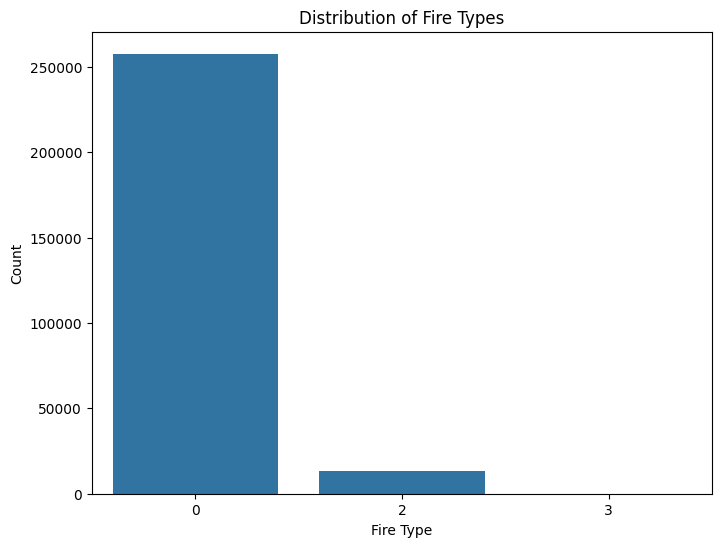

In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(x='type', data=df)
plt.title('Distribution of Fire Types')
plt.xlabel('Fire Type')
plt.ylabel('Count')
plt.show()

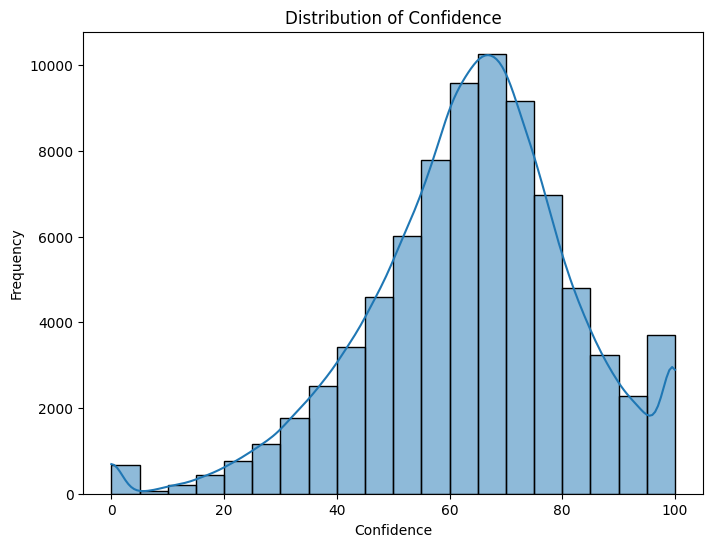

In [11]:
plt.figure(figsize=(8, 6))
sns.histplot(df['confidence'], bins=20, kde=True)
plt.title('Distribution of Confidence')
plt.xlabel('Confidence')
plt.ylabel('Frequency')
plt.show()

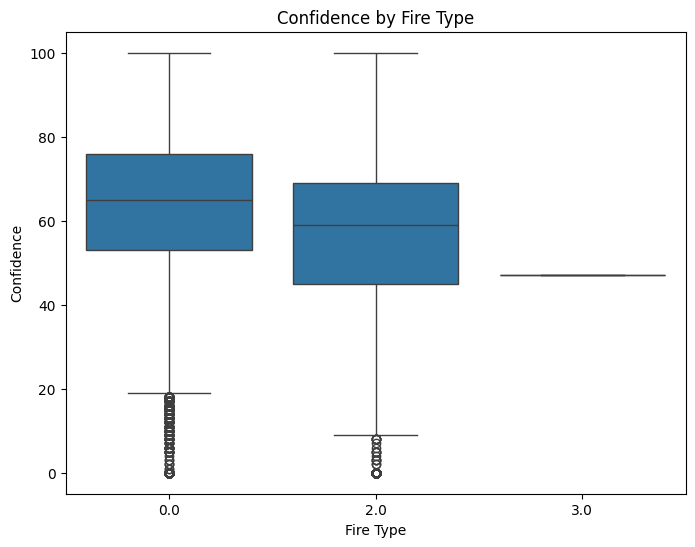

In [12]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='type', y='confidence', data=df)
plt.title('Confidence by Fire Type')
plt.xlabel('Fire Type')
plt.ylabel('Confidence')
plt.show()

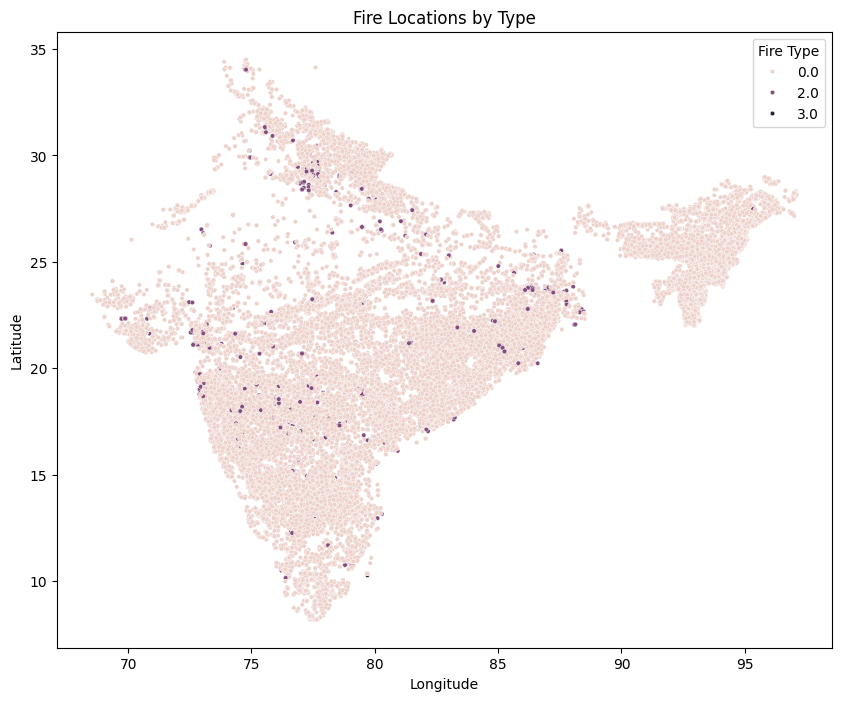

In [13]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x='longitude', y='latitude', data=df, hue='type', s=10)
plt.title('Fire Locations by Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Fire Type')
plt.show()

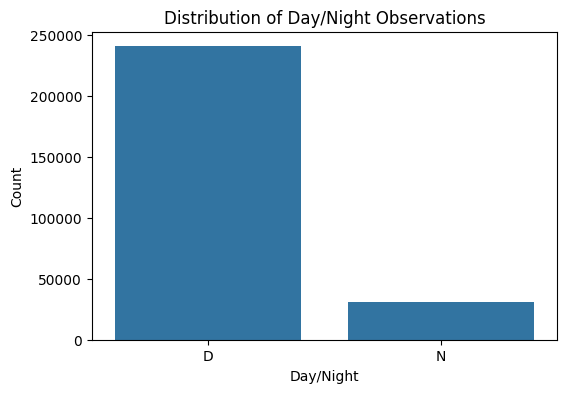

In [ ]:
plt.figure(figsize=(6, 4))
sns.countplot(x='daynight', data=df)
plt.title('Distribution of Day/Night Observations')
plt.xlabel('Day/Night')
plt.ylabel('Count')
plt.show()

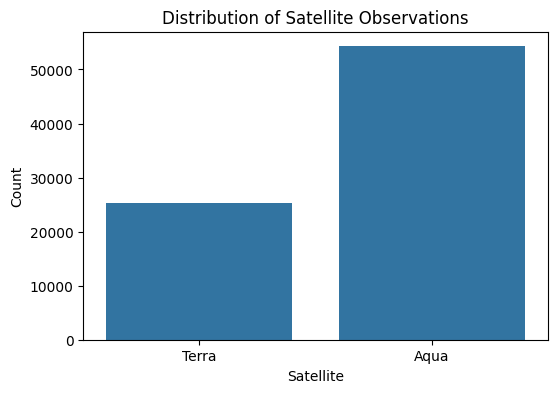

In [14]:
plt.figure(figsize=(6, 4))
sns.countplot(x='satellite', data=df)
plt.title('Distribution of Satellite Observations')
plt.xlabel('Satellite')
plt.ylabel('Count')
plt.show()

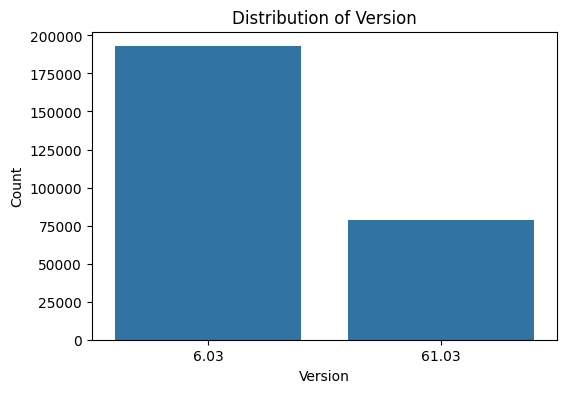

In [ ]:
plt.figure(figsize=(6, 4))
sns.countplot(x='version', data=df)
plt.title('Distribution of Version')
plt.xlabel('Version')
plt.ylabel('Count')
plt.show()

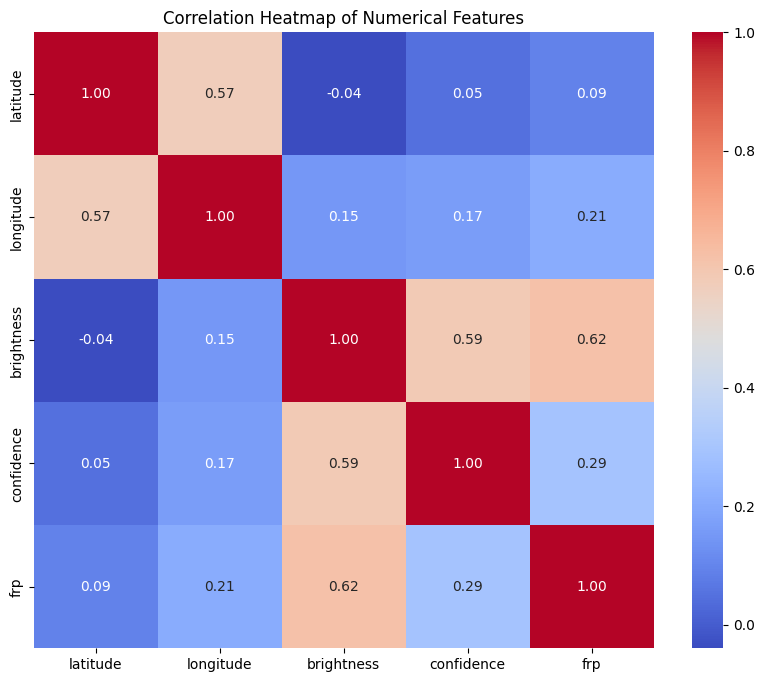

In [15]:
plt.figure(figsize=(10, 8))
correlation_matrix = df[['latitude', 'longitude', 'brightness', 'confidence', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [17]:
numerical_cols = df.select_dtypes(include=np.number).columns

In [18]:
numerical_cols

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_time',
       'confidence', 'version', 'bright_t31', 'frp', 'type'],
      dtype='object')

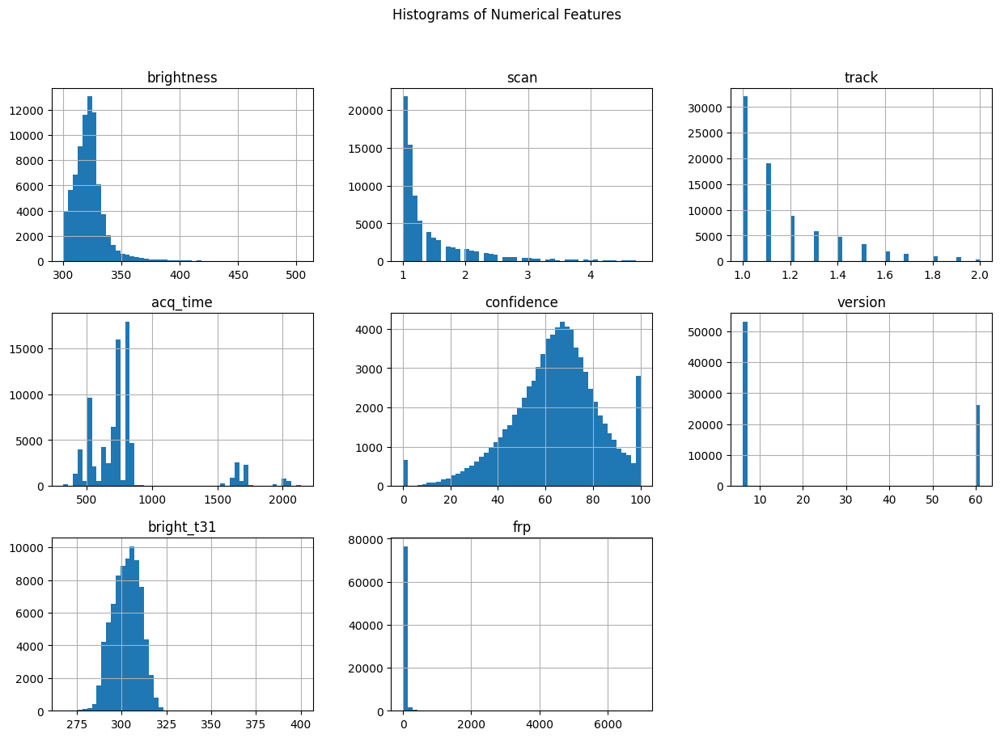

In [21]:
numerical_cols = ['brightness', 'scan', 'track', 'acq_time','confidence', 'version', 'bright_t31', 'frp']
df[numerical_cols].hist(bins=50, figsize=(15, 10))
plt.suptitle('Histograms of Numerical Features')
plt.show()

Analyzing distribution for: brightness


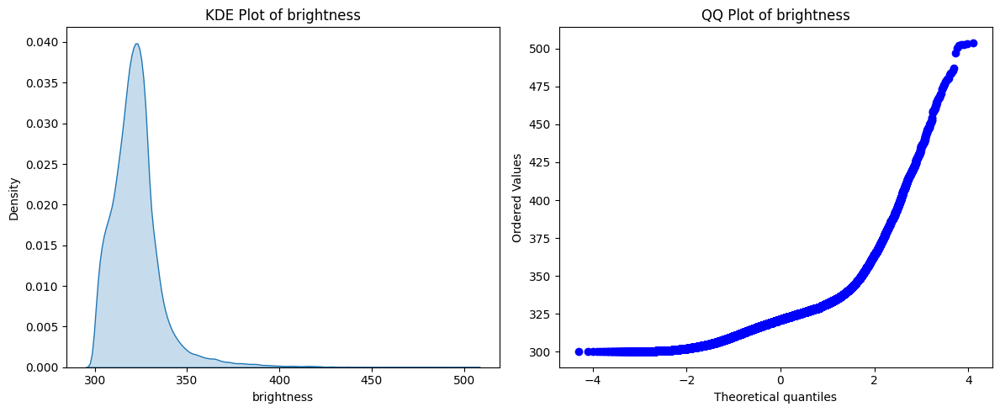

--------------------------------------------------
Analyzing distribution for: confidence


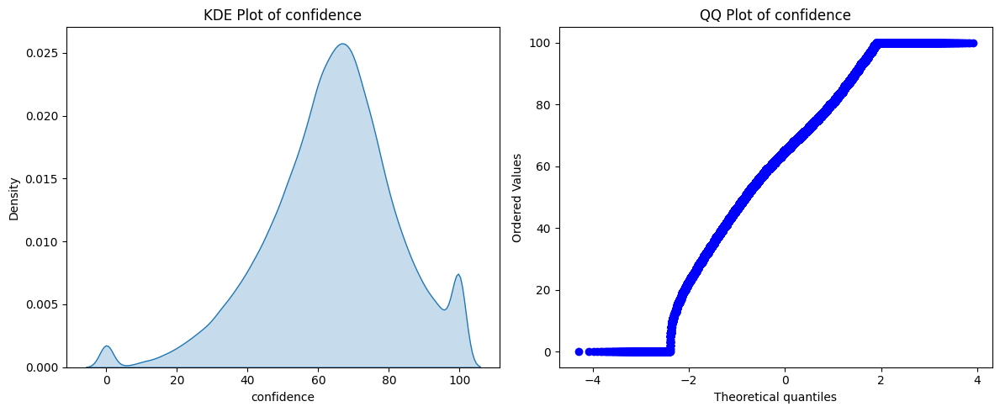

--------------------------------------------------
Analyzing distribution for: frp


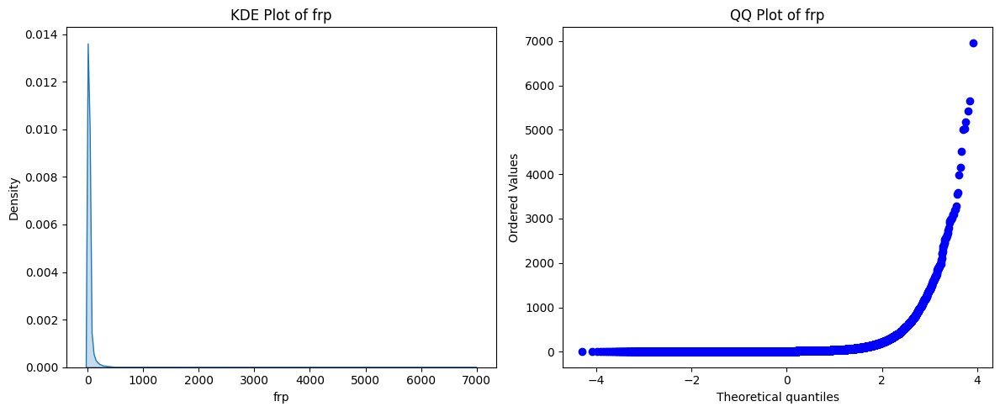

--------------------------------------------------
Analyzing distribution for: bright_t31


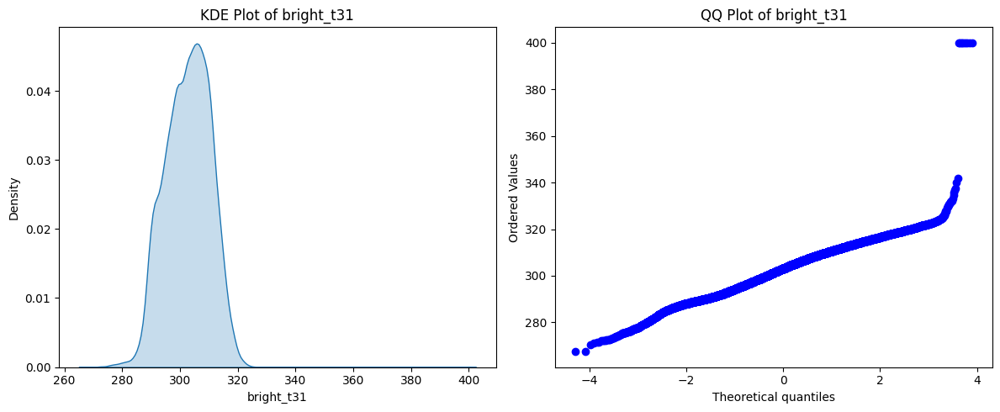

--------------------------------------------------
Analyzing distribution for: scan


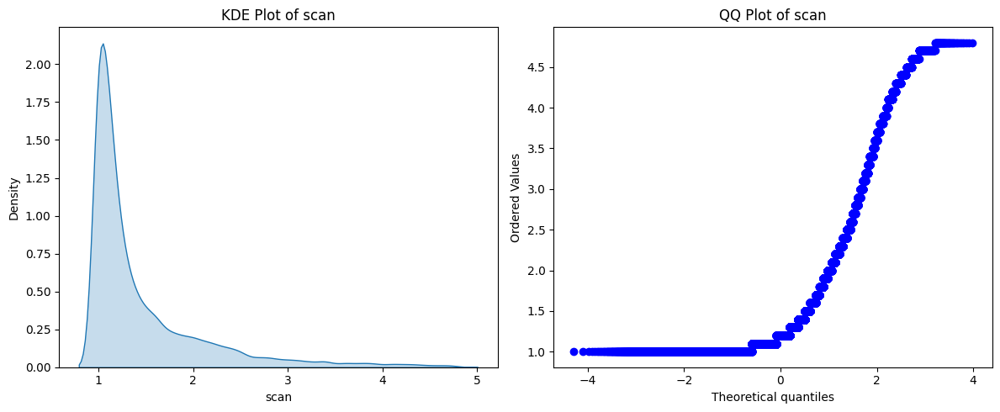

--------------------------------------------------
Analyzing distribution for: track


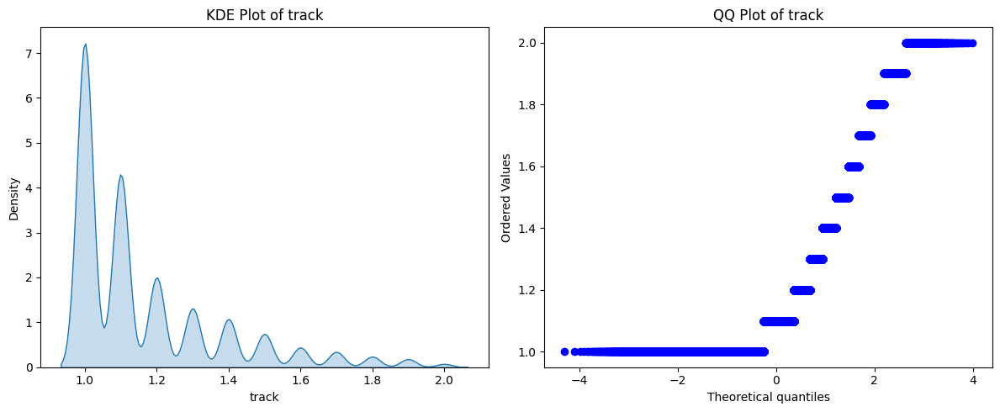

--------------------------------------------------


In [22]:
import statsmodels.api as sm
import scipy.stats as stats

# List of numerical features to check for distribution
numerical_features = ['brightness', 'confidence', 'frp', 'bright_t31', 'scan', 'track']

for feature in numerical_features:
    print(f"Analyzing distribution for: {feature}")

    # KDE Plot
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.kdeplot(df[feature], fill=True)
    plt.title(f'KDE Plot of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')

    # QQ Plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[feature], dist="norm", plot=plt)
    plt.title(f'QQ Plot of {feature}')

    plt.tight_layout()
    plt.show()
    print("-" * 50)

In [25]:
# Step 1: Coerce invalid 'acq_time' values to NaN
df['acq_time_clean'] = pd.to_numeric(df['acq_time'], errors='coerce')

# Step 2: Remove or Handle NaNs
# Option 1: Drop rows where 'acq_time' is invalid
df = df.dropna(subset=['acq_time_clean'])

# Option 2: Or fill invalid times with 0000 (Midnight)
# df['acq_time_clean'] = df['acq_time_clean'].fillna(0)

# Step 3: Convert to string, pad to 4 digits (HHMM), extract hour
df['acq_time_clean'] = df['acq_time_clean'].astype(int).astype(str).str.zfill(4)
df['hour'] = df['acq_time_clean'].str[:2].astype(int)


/tmp/ipython-input-396307750.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['acq_time_clean'] = df['acq_time_clean'].astype(int).astype(str).str.zfill(4)
/tmp/ipython-input-396307750.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['hour'] = df['acq_time_clean'].str[:2].astype(int)


/tmp/ipython-input-2672674236.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='month', palette='viridis')


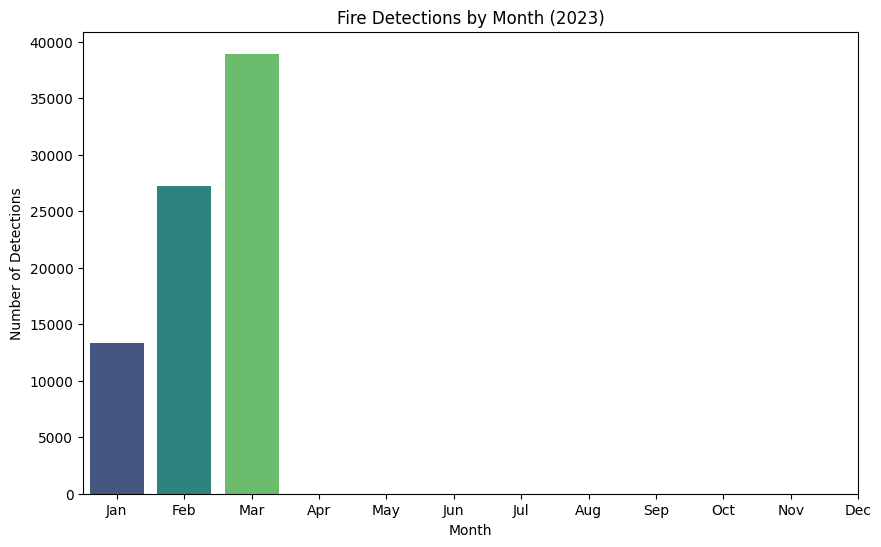

In [26]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='month', palette='viridis')
plt.title('Fire Detections by Month (2023)')
plt.xlabel('Month')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

/tmp/ipython-input-56-1413927136.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='day_of_week', palette='viridis')


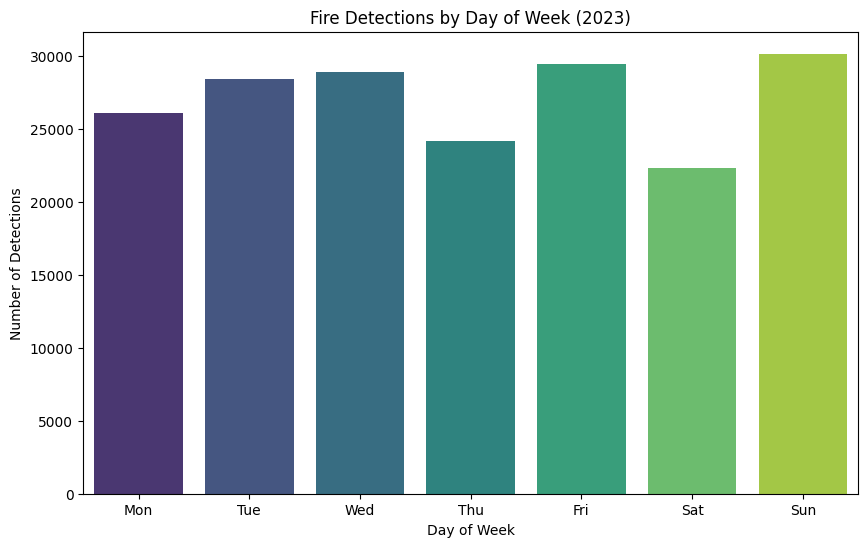

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='day_of_week', palette='viridis')
plt.title('Fire Detections by Day of Week (2023)')
plt.xlabel('Day of Week')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()

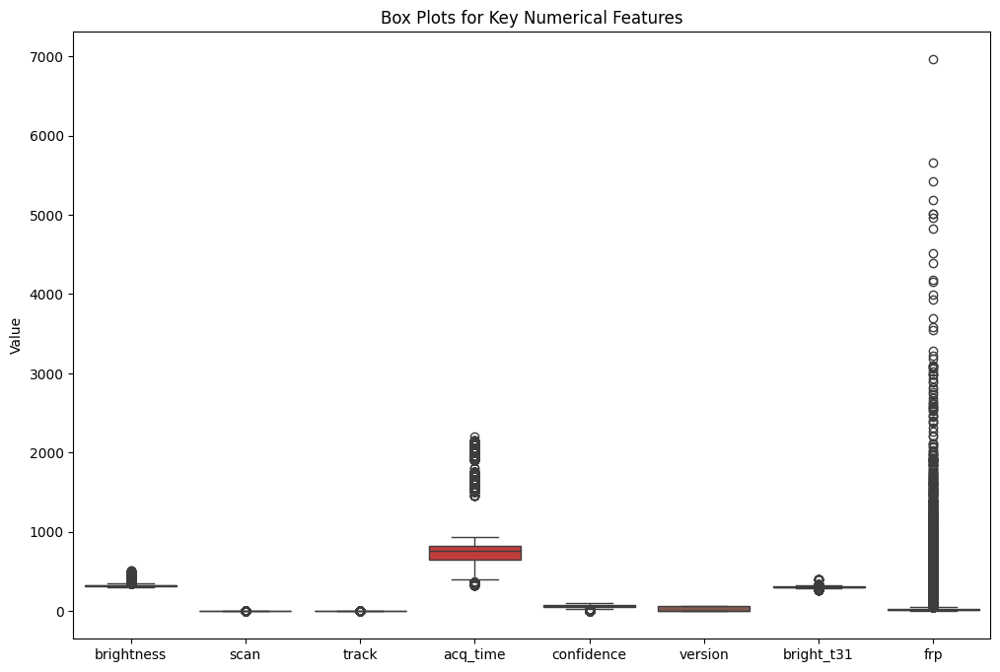

In [ ]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Key Numerical Features')
plt.ylabel('Value')
plt.show()

In [ ]:
def remove_outliers_iqr(df, column):
  Q1 = df[column].quantile(0.25)
  Q3 = df[column].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  df_cleaned = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)].copy()
  return df_cleaned

# Apply outlier removal to numerical columns
for col in numerical_cols:
  df = remove_outliers_iqr(df, col)

print("Shape after removing outliers:", df.shape)

Shape after removing outliers: (189370, 15)


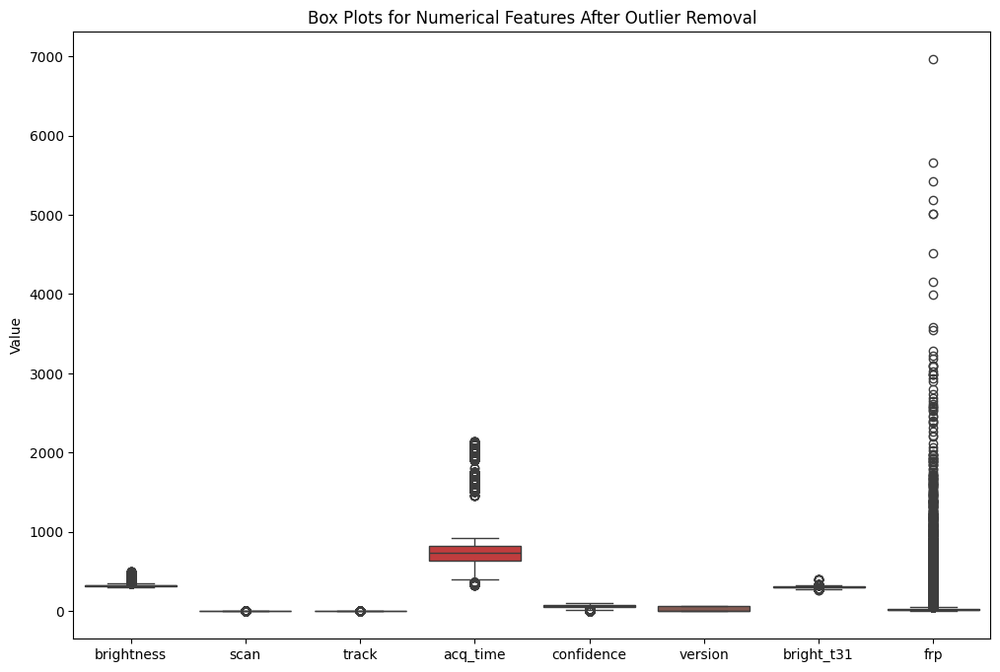

In [27]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Numerical Features After Outlier Removal')
plt.ylabel('Value')
plt.show()

In [28]:
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,...,bright_t31,frp,daynight,type,year,month,day_of_week,day_of_year,acq_time_clean,hour
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409.0,Terra,MODIS,44.0,...,292.6,8.6,D,0.0,2021.0,1.0,4.0,1.0,0409,4
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547.0,Terra,MODIS,37.0,...,287.4,9.0,D,0.0,2021.0,1.0,4.0,1.0,0547,5
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547.0,Terra,MODIS,8.0,...,286.5,5.4,D,0.0,2021.0,1.0,4.0,1.0,0547,5
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547.0,Terra,MODIS,46.0,...,287.7,10.7,D,0.0,2021.0,1.0,4.0,1.0,0547,5
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547.0,Terra,MODIS,43.0,...,287.6,9.0,D,0.0,2021.0,1.0,4.0,1.0,0547,5


In [29]:
df.type.value_counts()

,count
type,
0.0,75734
2.0,3764
3.0,1


In [ ]:
categorical_cols = df.select_dtypes(include='object').columns

In [ ]:
categorical_cols

Index(['satellite', 'instrument', 'daynight'], dtype='object')

In [30]:
# Select categorical columns for encoding
categorical_cols_to_encode = ['daynight', 'satellite', 'instrument']

# Apply One-Hot Encoding
df_encoded = pd.get_dummies(df, columns=categorical_cols_to_encode, drop_first=True)

In [31]:
df_encoded.head(100)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,acq_time_clean,hour,daynight_N,satellite_Terra
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409.0,44.0,6.03,292.6,8.6,0.0,2021.0,1.0,4.0,1.0,0409,4,False,True
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547.0,37.0,6.03,287.4,9.0,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547.0,8.0,6.03,286.5,5.4,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547.0,46.0,6.03,287.7,10.7,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547.0,43.0,6.03,287.6,9.0,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,31.4713,77.7909,300.2,1.2,1.1,2021-01-01,1647.0,21.0,6.03,275.6,10.6,0.0,2021.0,1.0,4.0,1.0,1647,16,True,True
96,27.2206,92.4247,312.3,1.4,1.2,2021-01-02,452.0,64.0,6.03,289.8,18.4,0.0,2021.0,1.0,5.0,2.0,0452,4,False,True
97,27.2410,92.4742,300.1,1.4,1.2,2021-01-02,452.0,18.0,6.03,287.8,7.4,0.0,2021.0,1.0,5.0,2.0,0452,4,False,True
98,27.2133,92.4663,302.6,1.4,1.2,2021-01-02,452.0,46.0,6.03,289.6,9.2,0.0,2021.0,1.0,5.0,2.0,0452,4,False,True


In [32]:
df_encoded.type.value_counts()

,count
type,
0.0,75734
2.0,3764
3.0,1


In [33]:
# !pip install folium
import folium

# Create map and sample data
india_map = folium.Map(location=[22.351115, 78.667743], zoom_start=5)
sample_df = df_encoded.sample(n=min(10000, len(df_encoded)), random_state=42)

# Add markers
for _, row in sample_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6,
        popup=f"FRP: {row['frp']:.2f}, Date: {row['acq_date'].strftime('%Y-%m-%d')}"
    ).add_to(india_map)

display(india_map)

In [34]:
scaler = StandardScaler()
numerical_cols_to_scale = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
df_encoded[numerical_cols_to_scale] = scaler.fit_transform(df_encoded[numerical_cols_to_scale])
df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,acq_time_clean,hour,daynight_N,satellite_Terra
0,28.0993,96.9983,-1.289547,-0.538190,-0.304417,2021-01-01,409.0,-1.069917,6.03,-1.287617,-0.219407,0.0,2021.0,1.0,4.0,1.0,0409,4,False,True
1,30.0420,79.6492,-1.368009,-0.089270,0.166526,2021-01-01,547.0,-1.451664,6.03,-1.953394,-0.216035,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True
2,30.0879,78.8579,-1.472625,-0.238910,-0.304417,2021-01-01,547.0,-3.033186,6.03,-2.068624,-0.246386,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True
3,30.0408,80.0501,-1.354932,0.060371,0.166526,2021-01-01,547.0,-0.960847,6.03,-1.914984,-0.201703,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True
4,30.6565,78.9668,-1.426856,-0.238910,-0.304417,2021-01-01,547.0,-1.124453,6.03,-1.927787,-0.216035,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True


In [35]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 79499 entries, 0 to 79500
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   latitude         79499 non-null  float64       
 1   longitude        79499 non-null  float64       
 2   brightness       79499 non-null  float64       
 3   scan             79499 non-null  float64       
 4   track            79499 non-null  float64       
 5   acq_date         79499 non-null  datetime64[ns]
 6   acq_time         79499 non-null  float64       
 7   confidence       79499 non-null  float64       
 8   version          79499 non-null  float64       
 9   bright_t31       79499 non-null  float64       
 10  frp              79499 non-null  float64       
 11  type             79499 non-null  float64       
 12  year             79499 non-null  float64       
 13  month            79499 non-null  float64       
 14  day_of_week      79499 non-null  float64   

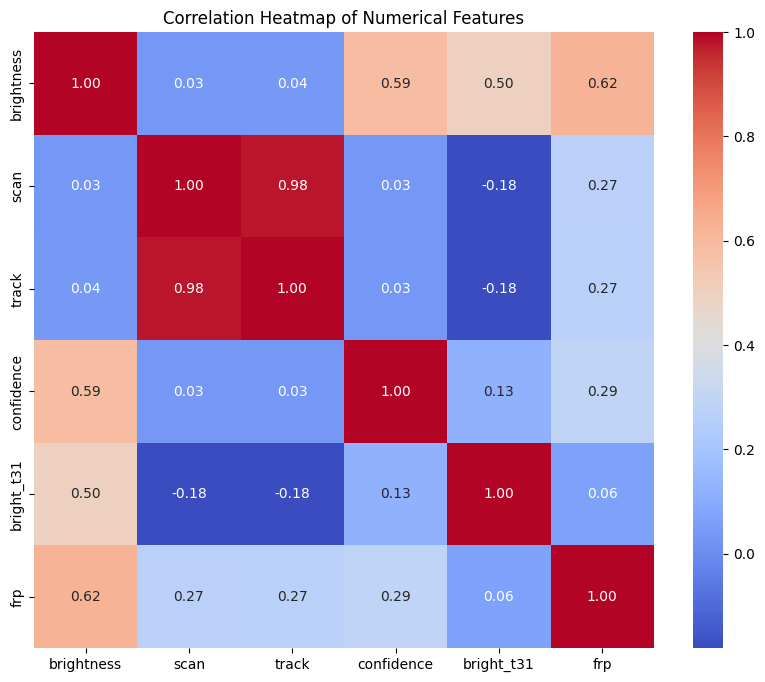

In [36]:
# Heatmap of correlations between numerical features
plt.figure(figsize=(10, 8))
correlation_matrix = df_encoded[['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [37]:
df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,acq_time_clean,hour,daynight_N,satellite_Terra
0,28.0993,96.9983,-1.289547,-0.538190,-0.304417,2021-01-01,409.0,-1.069917,6.03,-1.287617,-0.219407,0.0,2021.0,1.0,4.0,1.0,0409,4,False,True
1,30.0420,79.6492,-1.368009,-0.089270,0.166526,2021-01-01,547.0,-1.451664,6.03,-1.953394,-0.216035,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True
2,30.0879,78.8579,-1.472625,-0.238910,-0.304417,2021-01-01,547.0,-3.033186,6.03,-2.068624,-0.246386,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True
3,30.0408,80.0501,-1.354932,0.060371,0.166526,2021-01-01,547.0,-0.960847,6.03,-1.914984,-0.201703,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True
4,30.6565,78.9668,-1.426856,-0.238910,-0.304417,2021-01-01,547.0,-1.124453,6.03,-1.927787,-0.216035,0.0,2021.0,1.0,4.0,1.0,0547,5,False,True


In [38]:
df_encoded.type.value_counts()

,count
type,
0.0,75734
2.0,3764
3.0,1


In [39]:
# Separate features (X) and target variable (y)
# Assuming 'type' is the target variable you want to predict
# Drop temporal features if not intended for prediction task that uses 'type' as target
features = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
target = 'type'

X = df_encoded[features]
y = df_encoded[target]


In [40]:
X

,brightness,scan,track,confidence,bright_t31,frp
0,-1.289547,-0.538190,-0.304417,-1.069917,-1.287617,-0.219407
1,-1.368009,-0.089270,0.166526,-1.451664,-1.953394,-0.216035
2,-1.472625,-0.238910,-0.304417,-3.033186,-2.068624,-0.246386
3,-1.354932,0.060371,0.166526,-0.960847,-1.914984,-0.201703
4,-1.426856,-0.238910,-0.304417,-1.124453,-1.927787,-0.216035
...,...,...,...,...,...,...
79496,-0.328389,-0.538190,-0.304417,0.293464,-0.365773,-0.194958
79497,0.364692,-0.538190,-0.304417,1.002422,-0.288952,-0.081985
79498,0.188152,-0.538190,-0.304417,0.784281,-0.365773,-0.099690
79499,-0.629159,-0.538190,-0.304417,-0.524565,-0.378576,-0.219407


In [41]:
y

,type
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
79496,0.0
79497,0.0
79498,0.0
79499,0.0


In [42]:
!pip install -U imbalanced-learn
from imblearn.over_sampling import SMOTE

In [45]:
from imblearn.over_sampling import RandomOverSampler

# Use Random OverSampler instead of SMOTE
ros = RandomOverSampler(random_state=42)

# Apply Random Oversampling
X_resampled, y_resampled = ros.fit_resample(X, y)

# Check target distribution
print("Distribution after RandomOverSampler:")
print(y_resampled.value_counts())


Distribution after RandomOverSampler:
type
0.0    75734
2.0    75734
3.0    75734
Name: count, dtype: int64


In [46]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.25, random_state=42, stratify=y_resampled)

In [47]:
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (170401, 6)
Shape of X_test: (56801, 6)
Shape of y_train: (170401,)
Shape of y_test: (56801,)


In [48]:
# Import Logistic Regression to Train from SKlearn
loreg = LogisticRegression(max_iter=200)
loreg.fit(X_train,y_train)
loreg_pred = loreg.predict(X_test)
score = accuracy_score(y_test,loreg_pred)
cr = classification_report(y_test,loreg_pred)

print("Logistic Regression")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

Logistic Regression
Accuracy Score value: 0.7800
              precision    recall  f1-score   support

         0.0       0.70      0.68      0.69     18933
         2.0       0.70      0.66      0.68     18934
         3.0       0.92      1.00      0.96     18934

    accuracy                           0.78     56801
   macro avg       0.77      0.78      0.78     56801
weighted avg       0.77      0.78      0.78     56801



In [49]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
dtc.fit(X_train,y_train)
dtc_pred = dtc.predict(X_test)
score = accuracy_score(y_test,dtc_pred)
cr = classification_report(y_test,dtc_pred)

print("Decision Tree")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

Decision Tree
Accuracy Score value: 0.9828
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97     18933
         2.0       0.95      1.00      0.97     18934
         3.0       1.00      1.00      1.00     18934

    accuracy                           0.98     56801
   macro avg       0.98      0.98      0.98     56801
weighted avg       0.98      0.98      0.98     56801



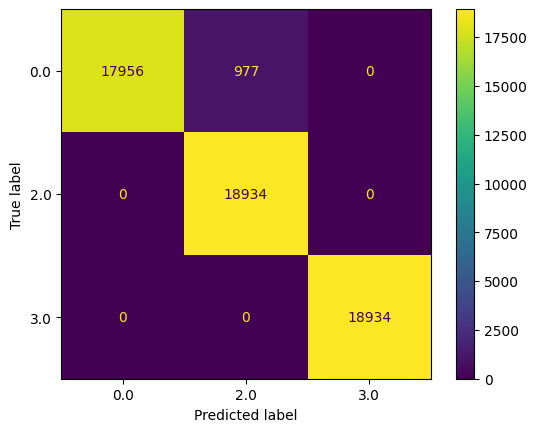

In [50]:
dt_cm = ConfusionMatrixDisplay.from_estimator(dtc, X_test, y_test)

In [51]:
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
rfc_pred = rfc.predict(X_test)
score = accuracy_score(y_test,rfc_pred)
cr = classification_report(y_test,rfc_pred)

print("Random Forest")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

Random Forest
Accuracy Score value: 0.9953
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99     18933
         2.0       0.99      1.00      0.99     18934
         3.0       1.00      1.00      1.00     18934

    accuracy                           1.00     56801
   macro avg       1.00      1.00      1.00     56801
weighted avg       1.00      1.00      1.00     56801



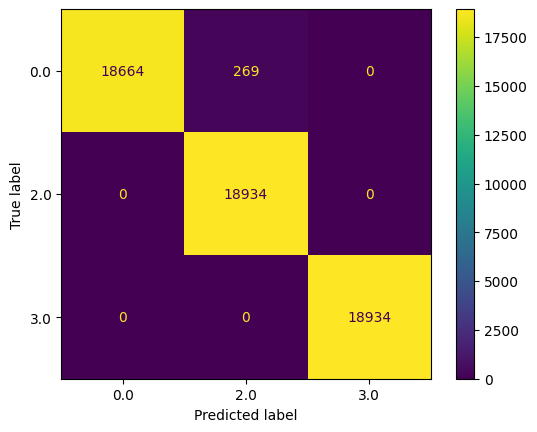

In [52]:
rf_cm = ConfusionMatrixDisplay.from_estimator(rfc, X_test, y_test)

In [53]:
# KNeighborsClassifier to Train from SKlearn
knnc = KNeighborsClassifier()
knnc.fit(X_train,y_train)
knn_pred = knnc.predict(X_test)
score = accuracy_score(y_test,knn_pred)
cr = classification_report(y_test,knn_pred)

print("KNeighbors Classifier")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

KNeighbors Classifier
Accuracy Score value: 0.9520
              precision    recall  f1-score   support

         0.0       1.00      0.86      0.92     18933
         2.0       0.87      1.00      0.93     18934
         3.0       1.00      1.00      1.00     18934

    accuracy                           0.95     56801
   macro avg       0.96      0.95      0.95     56801
weighted avg       0.96      0.95      0.95     56801



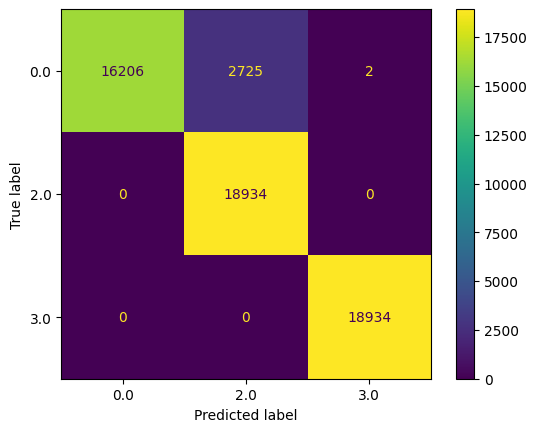

In [54]:
knn_cm = ConfusionMatrixDisplay.from_estimator(knnc, X_test, y_test)

In [55]:
# Collect the accuracies of each model
model_accuracies = {
    "Logistic Regression": accuracy_score(y_test, loreg_pred),
    "Decision Tree": accuracy_score(y_test, dtc_pred),
    "Random Forest": accuracy_score(y_test, rfc_pred),
    "KNeighbors Classifier": accuracy_score(y_test, knn_pred)
}

# Find the best model
best_model_name = max(model_accuracies, key=model_accuracies.get)
best_model_accuracy = model_accuracies[best_model_name]

print("Model Accuracies:")
for model, accuracy in model_accuracies.items():
    print(f"{model}: {accuracy:.4f}")

print(f"\nBest Model: {best_model_name} with Accuracy: {best_model_accuracy:.4f}")

Model Accuracies:
Logistic Regression: 0.7800
Decision Tree: 0.9828
Random Forest: 0.9953
KNeighbors Classifier: 0.9520

Best Model: Random Forest with Accuracy: 0.9953


In [56]:
import joblib

# Save the best model
# Based on the previous output, let's assume Random Forest was the best model.
best_model = rfc

joblib.dump(best_model, 'best_fire_detection_model.pkl')

# Save the StandardScaler instance
joblib.dump(scaler, 'scaler.pkl')

print("Best model and scaler saved successfully.")

Best model and scaler saved successfully.
